Extension of m2.3, this time removing the FPN portion of Darknet and only using the (highest resolution) feature map on the downsampling path. This is removing aroun 60% of the network (in terms of number of convolutional layers). This has a noticeable effect on inference time, down to 28 seconds from 44 seconds and the accuracy remains as strong. However the inference time is still not fast enough, it needs to be around 10-15 seconds.

In [2]:
cd ..

/home/ubuntu/mini-metro


In [3]:
from plugins.SerpentMiniMetroGamePlugin.files.api.object_detector.pytorch_detector import PytorchObjectDetector
import skimage.io
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
model_path = 'ml_train/station_detector/pytorch/models/m2.3.1/checkpoints/yolov3_ckpt_40.pth'
config_path = 'ml_train/station_detector/pytorch/models/m2.3.1/yolov3-custom.cfg'
labels_path = None
img_size = 416
conf_threshold = 0.5
nms_threshold = 0.1

In [5]:
station_detector = PytorchObjectDetector(model_path, config_path, labels_path, img_size)

### Running inference and plotting results on 'test' images

In [6]:
img_paths = list(Path("ml_train/station_detector/pytorch/data/test").glob("*.png"))
img_filenames = [img_path.name for img_path in img_paths]

In [9]:
%%time
images = [skimage.io.imread(img_path) for img_path in img_paths]

detection_results = [station_detector.predict(image, conf_threshold, nms_threshold) for image in images] 

CPU times: user 26.9 s, sys: 464 ms, total: 27.4 s
Wall time: 27.4 s


/home/ubuntu/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


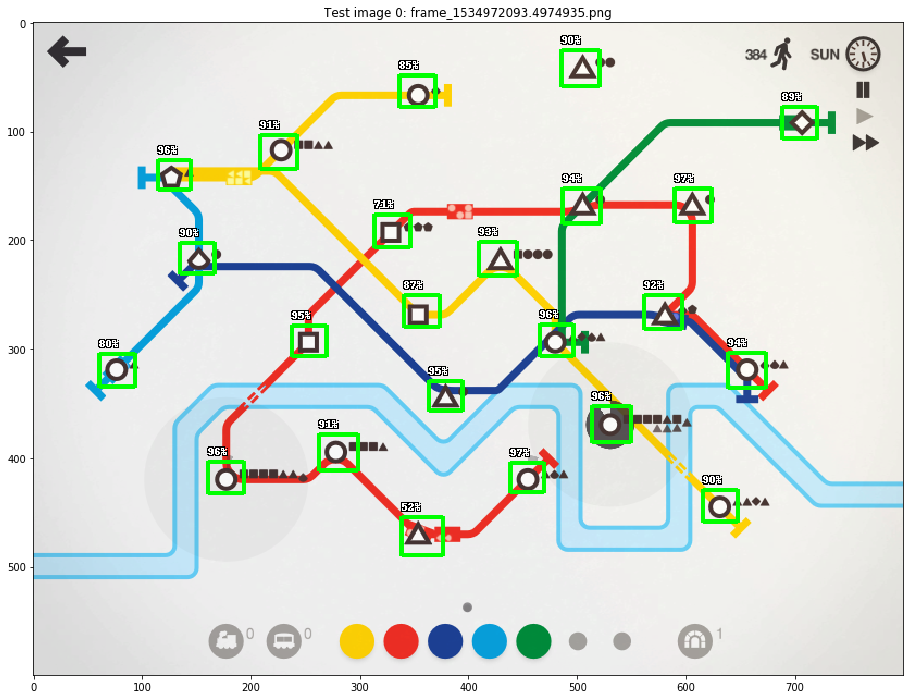

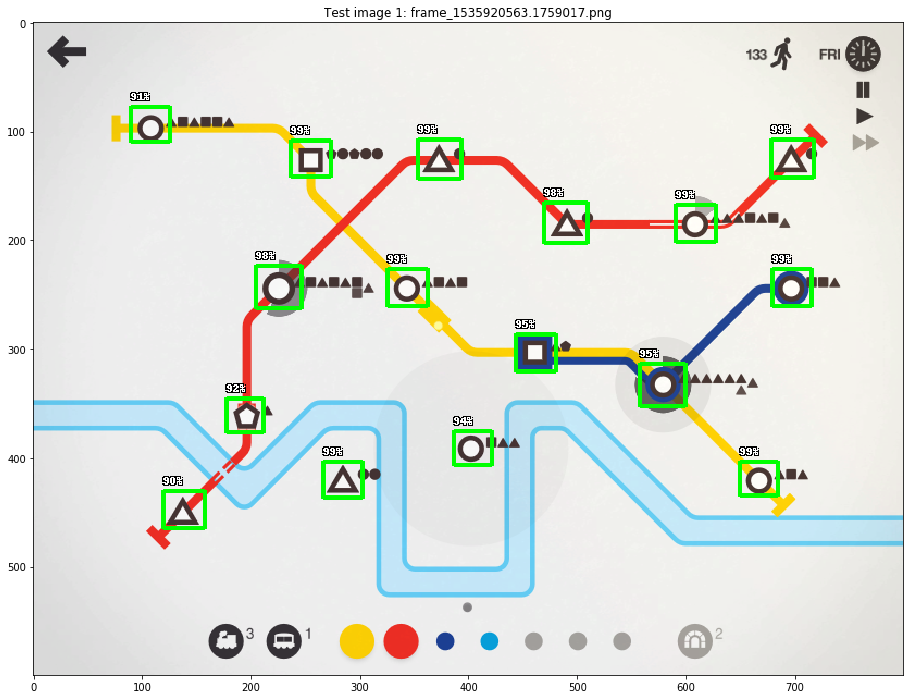

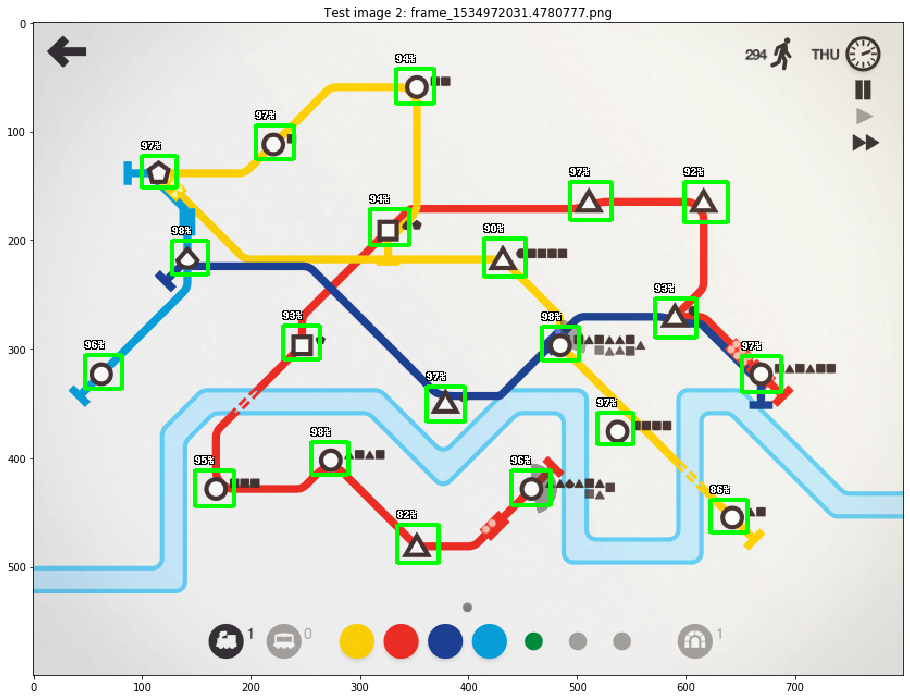

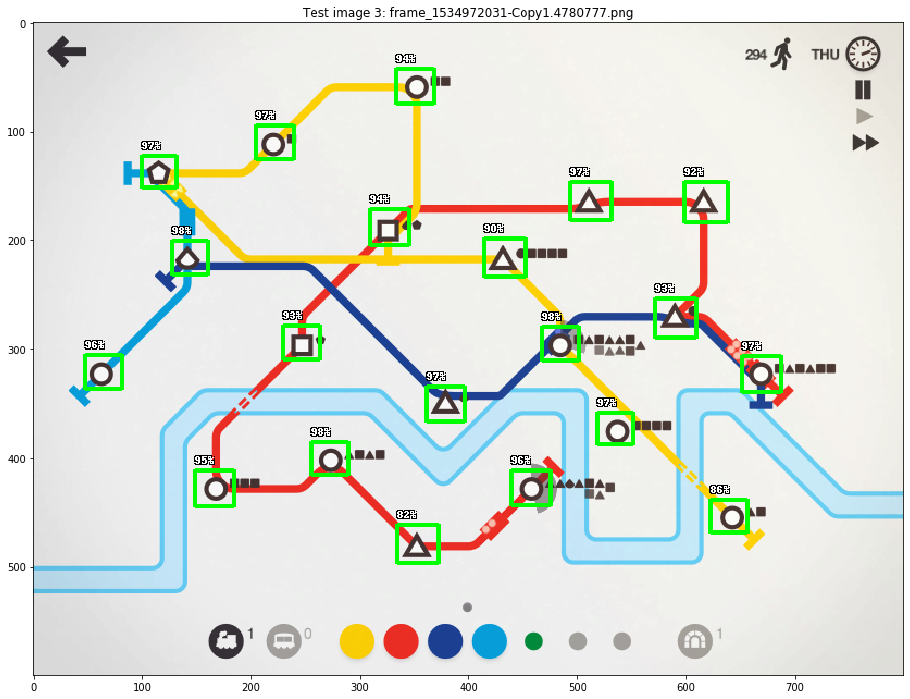

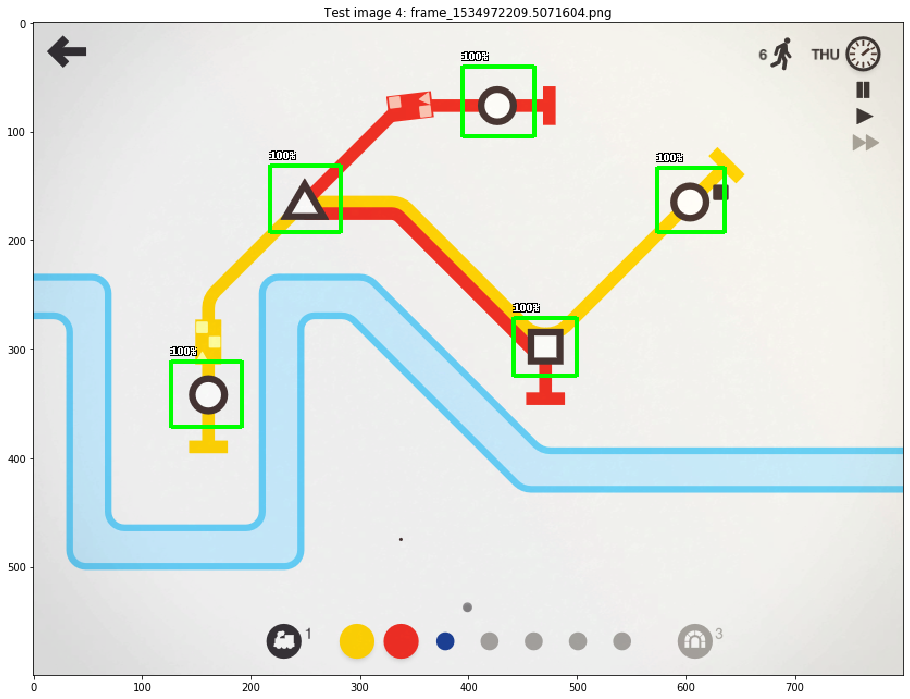

...

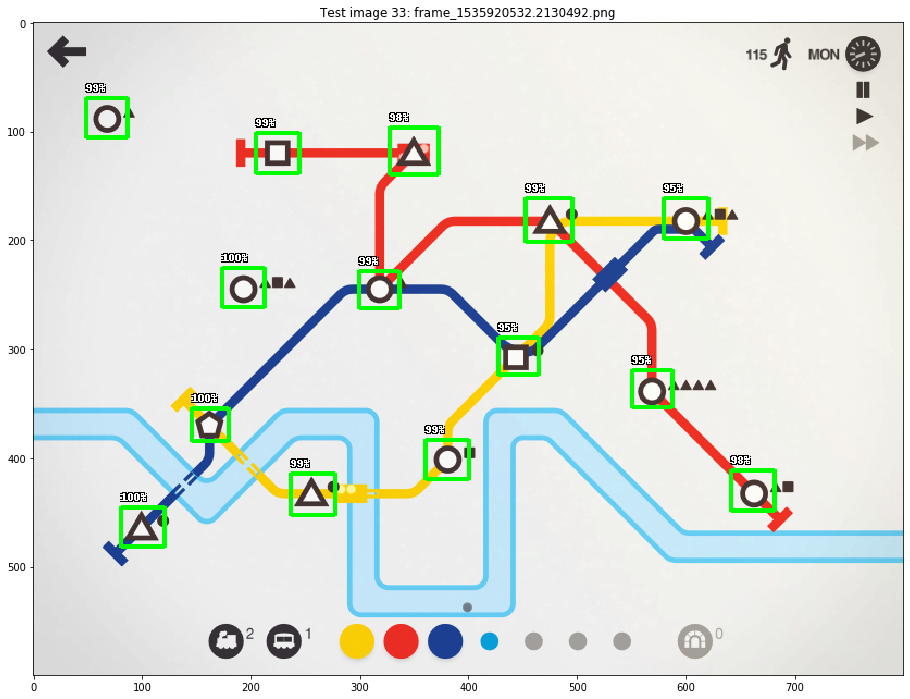

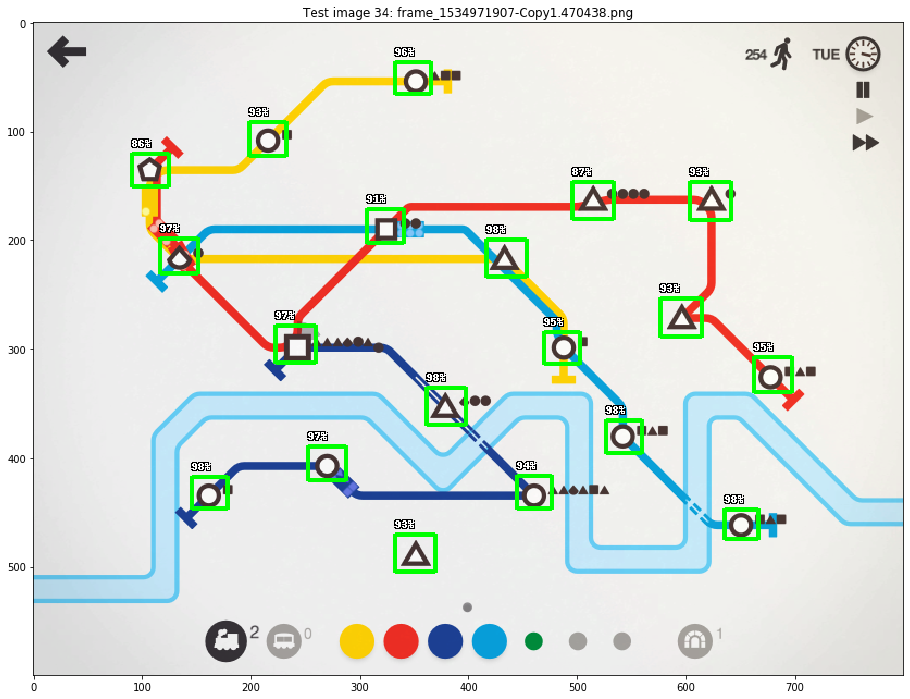

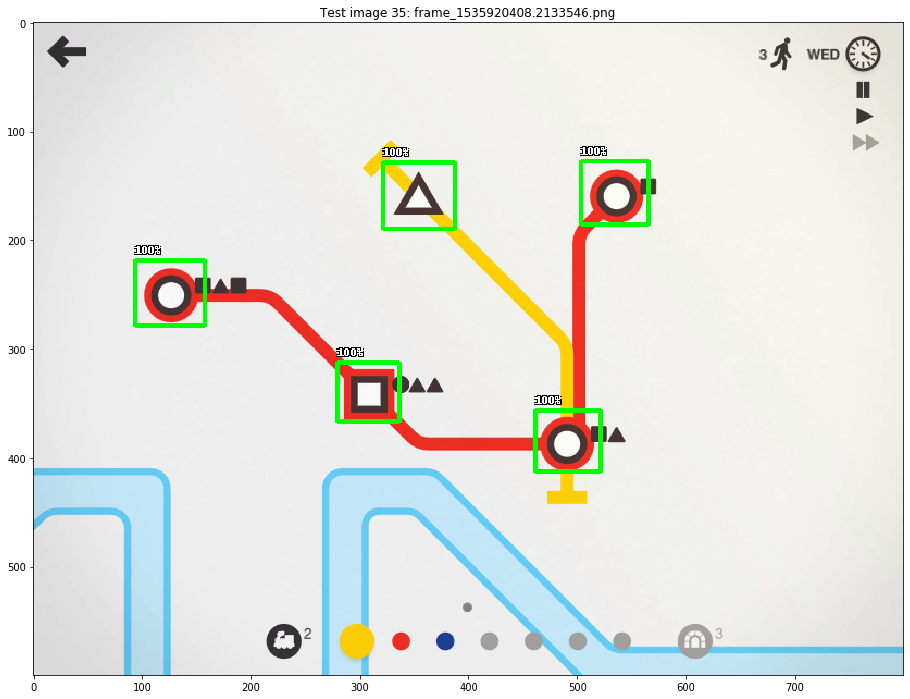

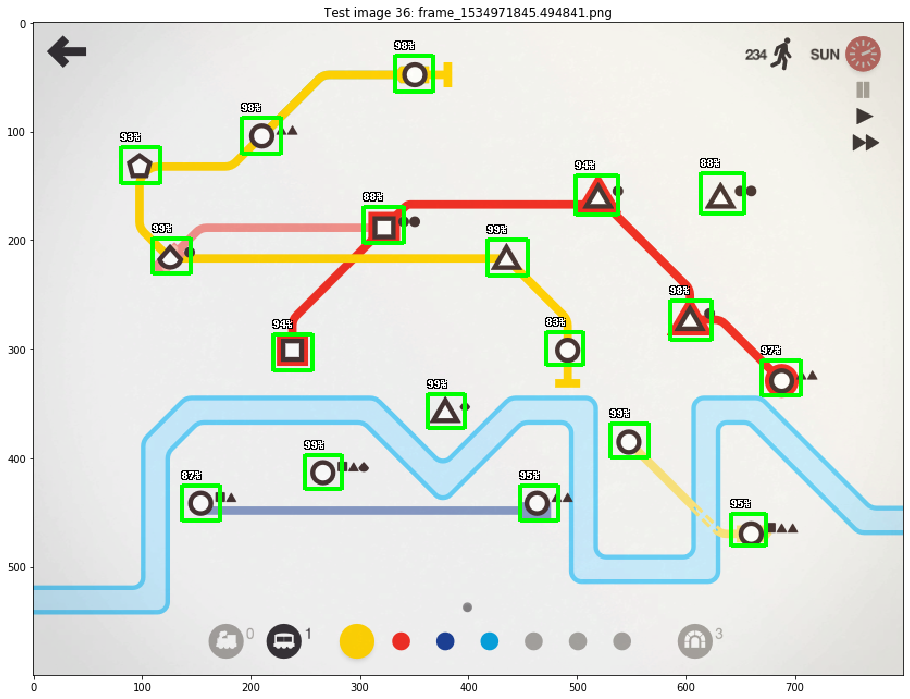

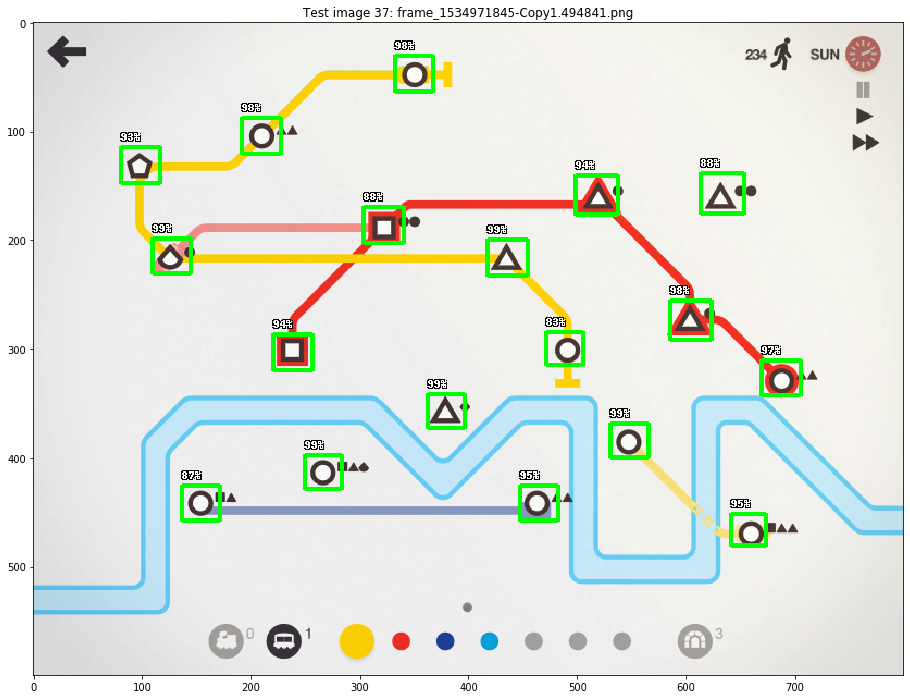

In [8]:
for i, (image, img_filename, detection_result) in enumerate(zip(images, img_filenames, detection_results)):
    _, ax = plt.subplots(figsize=(22,12))
    image_box = station_detector.draw_bounding_boxes(image, **detection_result) 
    ax.set_title(f"Test image {i}: {img_filename}")
    ax.imshow(image_box);